In [1]:
# Standard library imports
import sys
from pathlib import Path

# Add the relative paths to 'database_functions.py' and 'eda_functions.py'
database_functions_path = Path(
    "..",
    "..",
    "005_data-analysis-scripts",
    "002_exploratory-analysis",
    "002_database-functions",
)
eda_functions_path = Path(
    "..",
    "..",
    "005_data-analysis-scripts",
    "002_exploratory-analysis",
    "003_exploratory-data-analysis",
)

# Append the paths to sys.path
sys.path.append(str(database_functions_path))
sys.path.append(str(eda_functions_path))

# Third-party library imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import json
import requests

# Custom module imports
import database_functions as func
from eda_functions import choropleth

# Configure inline plotting for Jupyter
%matplotlib inline

# Create a Database instance
path = r"008_supplemental\002_clean-data"
db = func.Database(path)
print("Database initialized successfully.")

Database initialized successfully.


# Facility Records Dataset

## Task 1: Basic statistics and data overview of the 'fascility records' table

In [5]:
def load_facility_records(db=None):

    if db is None:
        db = func.Database()

    # Load the facility_records table
    facility_records_df = db.facility_records()

    # remove '_1' from the column names, '_1' was added to the column names to avoid conflicts with the column names from aggregated fasciltiy table
    facility_records_df.columns = [
        col.replace("_1", "") for col in facility_records_df.columns
    ]

    # cast mortality_rate_facility and readmission_rate_facility to numeric
    facility_records_df["mortality_rate_facility"] = pd.to_numeric(
        facility_records_df["mortality_rate_facility"], errors="coerce"
    )
    facility_records_df["readmission_rate_facility"] = pd.to_numeric(
        facility_records_df["readmission_rate_facility"], errors="coerce"
    )

    # rename patient_hospital_readmission_category column
    facility_records_df.rename(
        columns={"patient_hospital_readmission_category": "readmission_category"},
        inplace=True,
    )

    view_columns = [
        "year",
        "county_name",
        "stations",
        "prof_np",
        "chain_own",
        "chain_org",
        "mortality_rate_facility",
        "readmission_rate_facility",
        "readmission_category",
        "fac_star",
        "xp_star",
        "staff_scr",
    ]
    db.facility_records.add_view("quality_of_care", view_columns)
    # Sort the dataframe by year and county_name
    facility_records_df = db.facility_records.quality_of_care.sort_values(
        ["year", "county_name"]
    ).reset_index(drop=True)

    return facility_records_df


facility_records_df = load_facility_records(db)
print(facility_records_df.describe().T)

print(facility_records_df.info())

print(facility_records_df.isnull().sum())

                             count         mean       std     min     25%  \
year                       37738.0  2021.027717  1.979136  2018.0  2019.0   
stations                   37741.0    20.639517  9.508625     0.0    16.0   
mortality_rate_facility    35434.0    21.802489  6.728506     0.0    17.6   
readmission_rate_facility  35342.0    26.576122  7.373863     0.0    22.1   
fac_star                   23504.0     3.663802  0.957137     1.0     3.0   
xp_star                    19895.0     3.611058  0.814083     1.0     3.0   
staff_scr                  23504.0    87.284717  3.733921    70.0    85.0   

                              50%     75%     max  
year                       2021.0  2023.0  2024.0  
stations                     21.0    25.0    76.0  
mortality_rate_facility      21.0    24.9    83.5  
readmission_rate_facility    26.6    30.9    70.6  
fac_star                      4.0     4.0     5.0  
xp_star                       4.0     4.0     5.0  
staff_scr          

## Task 2: Visualize Pairwise Relationships of Quality of Care Metrics by Chain Ownership

Text(0.5, 1.02, 'Pairwise Relationships of Quality of Care Metrics by Profit/Non-Profit Status')

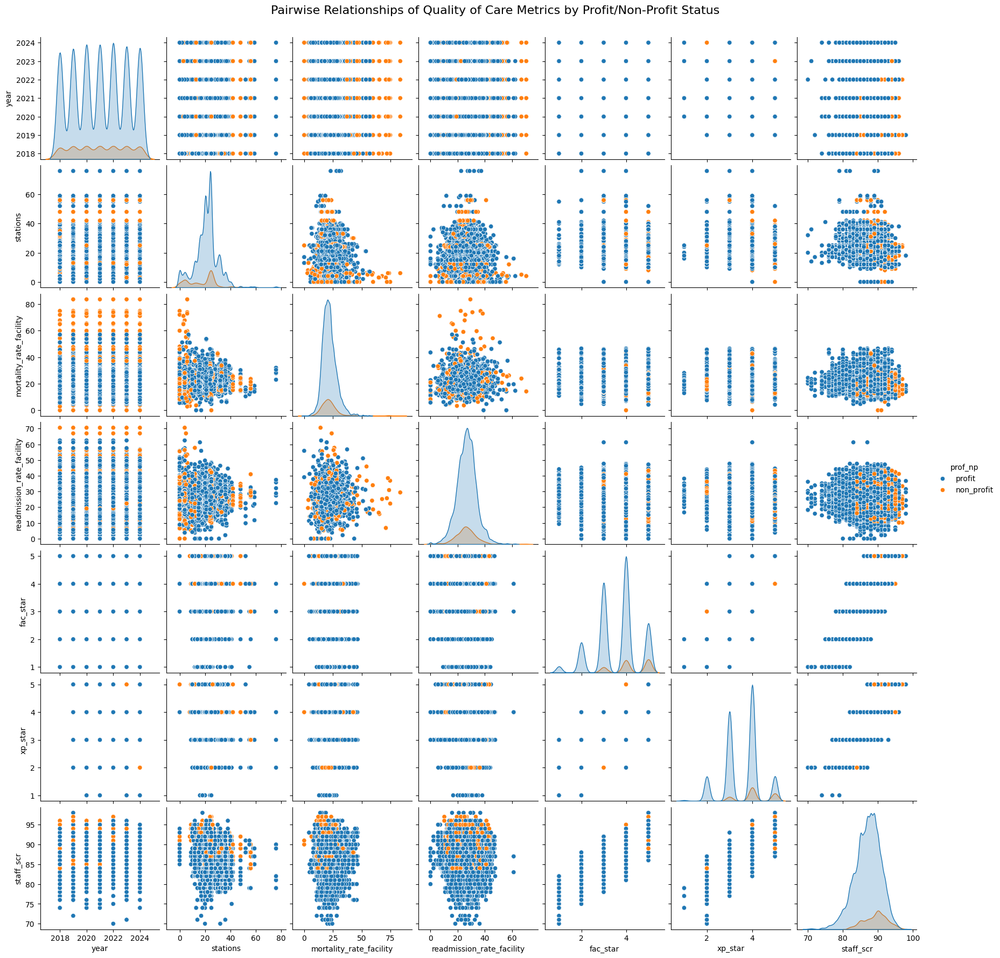

In [6]:
# Select the columns to be used in the pairplot
all_columns = [
    "year",
    "stations",
    "mortality_rate_facility",
    "readmission_rate_facility",
    "fac_star",
    "xp_star",
    "staff_scr",
]
var_columns = ["mortality_rate_facility", "readmission_rate_facility"]

# Create the pairplot with the filtered columns
g = sns.pairplot(data=facility_records_df, vars=all_columns, hue="prof_np")

# Add a title to the entire pairplot
g.fig.suptitle(
    "Pairwise Relationships of Quality of Care Metrics by Profit/Non-Profit Status",
    fontsize=16,
    y=1.02,
)

## Task 3: Pairwise Relationships of Quality of Care Metrics by Chain Ownership

Text(0.5, 1.02, 'Pairwise Relationships of Quality of Care Metrics by Chain Ownership')

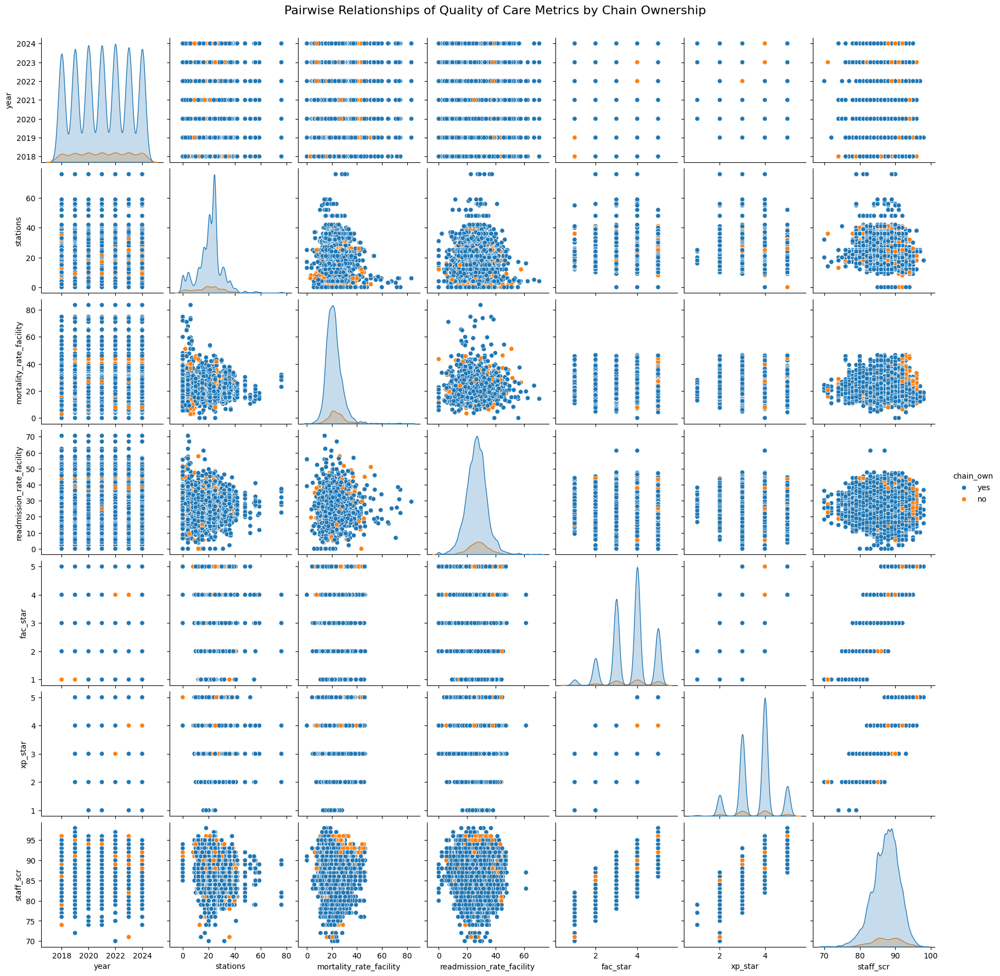

In [7]:
# Select the columns to be used in the pairplot
all_columns = [
    "year",
    "stations",
    "mortality_rate_facility",
    "readmission_rate_facility",
    "fac_star",
    "xp_star",
    "staff_scr",
]
var_columns = ["mortality_rate_facility", "readmission_rate_facility"]

# Create the pairplot with the filtered columns
g = sns.pairplot(data=facility_records_df, vars=all_columns, hue="chain_own")

# Add a title to the entire pairplot
g.fig.suptitle(
    "Pairwise Relationships of Quality of Care Metrics by Chain Ownership",
    fontsize=16,
    y=1.02,
)

# Aggregated Fascility Dataset

## Task 1: Basic statistics and data overview of the 'fascility' table

In [21]:
# Load aggregated fascility table
facility_agg = db.facility()
facility_agg.info()

print(facility_agg.describe().T)
print(facility_agg.info())
print(facility_agg.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 316 entries, 0 to 315
Data columns (total 19 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   county_name                            316 non-null    object 
 1   year                                   316 non-null    int64  
 2   fac_count                              316 non-null    int64  
 3   stations                               316 non-null    int64  
 4   prof_np                                316 non-null    float64
 5   chain_own                              316 non-null    float64
 6   survey_count                           316 non-null    int64  
 7   survey_rate                            78 non-null     float64
 8   fac_star                               275 non-null    float64
 9   xp_star                                234 non-null    float64
 10  comm_scr                               275 non-null    float64
 11  qualit

In [8]:
def load_facility_coverage(db=None):

    if db is None:
        db = func.Database()

    # Create covereage view for facility table
    coverage_columns = [
        "year",
        "county_name",
        "fac_count",
        "stations",
        "prof_np",
        "chain_own",
    ]
    db.facility.add_view("coverage", coverage_columns)

    # Create user_count view for medicare table
    user_count_columns = ["year", "county_name", "user_cnt"]
    db.medicare.add_view("user_count", user_count_columns)

    # Merge the coverage and user_count views
    df = db.merge_views([("facility", "coverage"), ("medicare", "user_count")]).copy()

    # Create per capita stations column
    df["stations_per_capita"] = df["stations"] / df["user_cnt"]

    # Constriaints to Year 2018-2022
    df = df[(df["year"] >= 2018) & (df["year"] <= 2022)]

    # Sort the dataframe by year and county_name
    df.sort_values(["year", "county_name"])
    df.reset_index(drop=True)

    return df


facility_coverage_df = load_facility_coverage(db)
print(facility_coverage_df.head())

    county_name  year  fac_count  stations   prof_np  chain_own  user_cnt  \
0       Alameda  2018      240.0    4733.0  0.820833        1.0    1455.0   
1         Butte  2018       32.0     584.0  0.750000        1.0     285.0   
2      Columbia  2018        2.0      26.0  1.000000        1.0       NaN   
3  Contra Costa  2018      137.0    2690.0  0.985401        1.0    1002.0   
4     El Dorado  2018        8.0     185.0  1.000000        1.0     125.0   

   stations_per_capita  
0             3.252921  
1             2.049123  
2                  NaN  
3             2.684631  
4             1.480000  


In [9]:
metrics = ["fac_count", "stations", "prof_np", "chain_own"]

for metric in metrics:
    fig = choropleth(
        data=facility_coverage_df,
        hue_column=metric,
        slider_column=None,
        title=f"{metric} by County in California",
    )
    fig.show()

# Medicare Dataset:

## Task 1: Basic statistics and data overview of the 'medicare' table

In [10]:
def load_medicare_race(db=None):

    if db is None:
        db = func.Database()

    # Load the medicare_race table
    race_columns = [
        "county_name",
        "race_wht_pct",
        "race_black_pct",
        "race_hspnc_pct",
        "race_othr_pct",
        "dual_pct",
    ]
    db.medicare.add_view("race", race_columns)
    medicare_race = db.medicare.race.copy()
    other_columns = ["race_othr_pct", "dual_pct"]
    medicare_race["race_other"] = medicare_race[other_columns].sum(axis=1)
    medicare_race.drop(columns=other_columns, inplace=True)
    medicare_race.sort_values("county_name", inplace=True)
    medicare_race.reset_index(drop=True, inplace=True)

    return medicare_race


medicare_race = load_medicare_race(db)


# Show summary statistics
print("\nSummary statistics \n")
print(medicare_race.describe().T, "\n")

# Display basic information about the voter table
print("Basic information \n")
print(medicare_race.info())

# Check for missing values
print("\nMissing values \n")
print(medicare_race.isnull().sum())


Summary statistics 

                count      mean       std     min     25%     50%      75%  \
race_wht_pct    471.0  0.716818  0.163089  0.2148  0.5887  0.7019  0.87435   
race_black_pct  471.0  0.030964  0.035756  0.0023  0.0074  0.0170  0.03970   
race_hspnc_pct  471.0  0.159155  0.129178  0.0287  0.0552  0.1241  0.22050   
race_other      531.0  0.338575  0.148350  0.0000  0.2247  0.3160  0.43600   

                   max  
race_wht_pct    0.9357  
race_black_pct  0.1656  
race_hspnc_pct  0.7484  
race_other      0.9495   

Basic information 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 531 entries, 0 to 530
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   county_name     522 non-null    object 
 1   race_wht_pct    471 non-null    float64
 2   race_black_pct  471 non-null    float64
 3   race_hspnc_pct  471 non-null    float64
 4   race_other      531 non-null    float64
dtypes: float64(4), o

## Task 2: Visualize Race Distribution According to Medicare Dataset

In [11]:
melted_medicare_race = pd.melt(
    medicare_race, id_vars=["county_name"], var_name="race", value_name="percentage"
)
melted_medicare_race["percentage"] = melted_medicare_race["percentage"].astype(float)

# Map the race values to the custom labels
custom_labels = {
    "race_wht_pct": "White",
    "race_black_pct": "Black",
    "race_hspnc_pct": "Hispanic",
    "race_other": "Other",
}

melted_medicare_race["race"] = melted_medicare_race["race"].replace(custom_labels)

In [12]:
fig = choropleth(
    melted_medicare_race, "percentage", "race", "Race Groups by County in California"
)
fig.show()

# Census Dataset:

## Task 1: Basic Stastical Analysis

In [13]:
age_group_columns = [
    "county_name",
    "under_5_years",
    "age_5_9",
    "age_10_14",
    "age_15_19",
    "age_20_24",
    "age_25_29",
    "age_30_34",
    "age_35_39",
    "age_40_44",
    "age_45_49",
    "age_50_54",
    "age_55_59",
    "age_60_64",
    "age_65_69",
    "age_70_74",
    "age_75_79",
    "age_80_84",
    "age_85_plus",
]

db.census.add_view("age_groups", age_group_columns)
census_age_groups = db.census.age_groups


race_columns = [
    "county_name",
    "white",
    "black_or_african_american",
    "hispanic_or_latino",
    "asian",
    "american_indian_and_alaska_native",
    "native_hawaiian_and_other_pacific_islander",
    "some_other_race",
    "two_or_more_races",
]
db.census.add_view("race", race_columns)


def load_race_df(db=None):

    if db is None:
        db = func.Database()

    race_df = db.census.race.copy()
    other_columns = [
        "asian",
        "native_hawaiian_and_other_pacific_islander",
        "some_other_race",
        "two_or_more_races",
        "american_indian_and_alaska_native",
    ]
    # sum these values up ant group them as other: 'native_hawaiian_and_other_pacific_islander', 'some_other_race', 'two_or_more_races'
    race_df["race_other"] = race_df[other_columns].sum(axis=1)
    race_df.drop(columns=other_columns, inplace=True)
    race_df.sort_values("county_name", inplace=True)
    race_df.reset_index(drop=True, inplace=True)

    return race_df


race_df = load_race_df(db)
race_df.head()

,county_name,white,black_or_african_american,hispanic_or_latino,race_other
0,Alameda,31.1,9.8,23.4,59.0
1,Alpine,67.6,0.8,7.0,31.6
2,Amador,76.8,3.1,14.9,20.1
3,Butte,70.7,1.7,19.0,27.7
4,Calaveras,80.2,0.8,12.9,18.9


In [14]:
melted_age_group = pd.melt(
    census_age_groups,
    id_vars=["county_name"],
    var_name="age_group",
    value_name="percentage",
)
melted_age_group["percentage"] = melted_age_group["percentage"].astype(float)


melted_race = pd.melt(
    race_df, id_vars=["county_name"], var_name="race", value_name="percentage"
)
melted_race["percentage"] = melted_race["percentage"].astype(float)


def calculate_avg_age(df):
    """
    Calculate the estimated average age for each county using a weighted average.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()

    age_groups = {
        "under_5_years": 2.5,
        "age_5_9": 7,
        "age_10_14": 12,
        "age_15_19": 17,
        "age_20_24": 22,
        "age_25_29": 27,
        "age_30_34": 32,
        "age_35_39": 37,
        "age_40_44": 42,
        "age_45_49": 47,
        "age_50_54": 52,
        "age_55_59": 57,
        "age_60_64": 62,
        "age_65_69": 67,
        "age_70_74": 72,
        "age_75_79": 77,
        "age_80_84": 82,
        "age_85_plus": 90,
    }

    weighted_columns = []
    for group, age in age_groups.items():
        weighted_column = f"{group}_weighted"
        df_copy.loc[:, weighted_column] = df_copy[group] * age
        weighted_columns.append(weighted_column)

    df_copy.loc[:, "estimated_avg_age"] = df_copy[weighted_columns].sum(axis=1) / 100
    return df_copy


def create_stacked_bar_plot(df):
    """
    Create a stacked bar plot showing top 10 and bottom 10 counties based on estimated average age.
    """
    # Sort counties by estimated average age
    sorted_counties = df.sort_values("estimated_avg_age", ascending=False)

    # Get top 10 and bottom 10 counties
    top_10 = sorted_counties.head(10)
    bottom_10 = sorted_counties.tail(10)[::-1]  # Reverse to show in descending order

    # Combine top and bottom counties
    plot_data = pd.concat([top_10, bottom_10])

    # Create subplots
    fig = make_subplots(
        rows=1,
        cols=2,
        subplot_titles=("Top 10 Counties by Avg Age", "Bottom 10 Counties by Avg Age"),
    )

    # Define age groups for stacking
    age_groups = [
        "under_5_years",
        "age_5_9",
        "age_10_14",
        "age_15_19",
        "age_20_24",
        "age_25_29",
        "age_30_34",
        "age_35_39",
        "age_40_44",
        "age_45_49",
        "age_50_54",
        "age_55_59",
        "age_60_64",
        "age_65_69",
        "age_70_74",
        "age_75_79",
        "age_80_84",
        "age_85_plus",
    ]

    # Color scale for age groups
    colors = px.colors.sequential.Viridis[::-1]  # Reverse Viridis color scale

    # Add bars for each age group
    for i, age_group in enumerate(age_groups):
        fig.add_trace(
            go.Bar(
                x=plot_data["county_name"][:10],
                y=plot_data[age_group][:10],
                name=age_group,
                marker_color=colors[i % len(colors)],
            ),
            row=1,
            col=1,
        )
        fig.add_trace(
            go.Bar(
                x=plot_data["county_name"][10:],
                y=plot_data[age_group][10:],
                name=age_group,
                marker_color=colors[i % len(colors)],
                showlegend=False,
            ),
            row=1,
            col=2,
        )

    # Update layout
    fig.update_layout(
        barmode="stack",
        title="Age Distribution in California Counties",
        height=600,
        width=1200,
    )

    # Update x-axis
    fig.update_xaxes(title_text="County", tickangle=45, row=1, col=1)
    fig.update_xaxes(title_text="County", tickangle=45, row=1, col=2)

    # Update y-axis
    fig.update_yaxes(title_text="Percentage", row=1, col=1)
    fig.update_yaxes(title_text="Percentage", row=1, col=2)

    return fig

In [15]:
fig = choropleth(
    melted_race, "percentage", "race", "Race Groups by County in California"
)
fig.show()

In [16]:
fig = choropleth(
    melted_age_group, "percentage", "age_group", "Age Groups by County in California"
)
fig.show()

df = calculate_avg_age(census_age_groups)
fig = create_stacked_bar_plot(df)
fig.show()

In [17]:
def create_full_age_distribution_heatmap(df):
    """
    Create a heatmap showing age distribution for all California counties.
    """
    # Sort counties by estimated average age
    sorted_counties = df.sort_values("estimated_avg_age", ascending=False)

    # Define age groups
    age_groups = [
        "under_5_years",
        "age_5_9",
        "age_10_14",
        "age_15_19",
        "age_20_24",
        "age_25_29",
        "age_30_34",
        "age_35_39",
        "age_40_44",
        "age_45_49",
        "age_50_54",
        "age_55_59",
        "age_60_64",
        "age_65_69",
        "age_70_74",
        "age_75_79",
        "age_80_84",
        "age_85_plus",
    ]

    # Prepare data for heatmap
    heatmap_data = sorted_counties[age_groups]

    # Create heatmap
    fig = go.Figure(
        data=go.Heatmap(
            z=heatmap_data.values,
            y=sorted_counties["county_name"],
            x=age_groups,
            colorscale="Viridis",
            colorbar=dict(title="Percentage"),
        )
    )

    # Update layout
    fig.update_layout(
        title="Age Distribution in All California Counties (Sorted by Average Age)",
        yaxis_title="County",
        xaxis_title="Age Group",
        xaxis_tickangle=-45,
        height=1500,  # Increased height to accommodate all counties
        width=1000,
    )

    # Add annotations for average age
    for i, county in enumerate(sorted_counties["county_name"]):
        fig.add_annotation(
            y=county,
            x="age_85_plus",
            text=f"{sorted_counties['estimated_avg_age'].iloc[i]:.1f}",
            showarrow=False,
            xshift=50,
            font=dict(size=8),
        )

    return fig


# Usage:
df = calculate_avg_age(census_age_groups)
fig = create_full_age_distribution_heatmap(df)
fig.show()

In [18]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
from statsmodels.stats.multitest import multipletests

df1 = load_race_df(db)
df2 = load_medicare_race(db)

# Function to perform chi-square test


def chi_square_test(row1, row2):
    # Ensure the order of categories is the same
    categories1 = [
        "white",
        "black_or_african_american",
        "hispanic_or_latino",
        "race_other",
    ]
    categories2 = ["race_wht_pct", "race_black_pct", "race_hspnc_pct", "race_other"]
    observed = np.array(
        [[row1[cat] for cat in categories1], [row2[cat] for cat in categories2]]
    )
    chi2, p_value, dof, expected = chi2_contingency(observed)
    return p_value


# Prepare df2 by grouping and summing percentages for each county
df2_grouped = (
    df2.groupby("county_name")
    .agg(
        {
            "race_wht_pct": "first",
            "race_black_pct": "first",
            "race_hspnc_pct": "first",
            "race_other": "first",
        }
    )
    .reset_index()
)

# Perform chi-square test for each county
results = {}
for county in df1["county_name"]:
    if county in df2_grouped["county_name"].values:
        row1 = df1[df1["county_name"] == county].iloc[0]
        row2 = df2_grouped[df2_grouped["county_name"] == county].iloc[0]
        p_value = chi_square_test(row1, row2)
        results[county] = p_value

# Adjust p-values for multiple comparisons using Bonferroni correction
adjusted_p_values = multipletests([v for v in results.values()], method="bonferroni")[1]

# Create a results dataframe
results_df = pd.DataFrame(
    {
        "County": list(results.keys()),
        "P-value": list(results.values()),
        "Adjusted P-value": adjusted_p_values,
    }
)

# Sort results by adjusted p-value
results_df = results_df.sort_values("Adjusted P-value")

# Print results
print(results_df)

# Optionally, save results to a CSV file
# results_df.to_csv('chi_square_results.csv', index=False)

print("\nCounties with similar distributions (adjusted p-value > 0.05):")
print(results_df[results_df["Adjusted P-value"] > 0.05]["County"].tolist())

print("\nCounties with different distributions (adjusted p-value <= 0.05):")
print(results_df[results_df["Adjusted P-value"] <= 0.05]["County"].tolist())

             County   P-value  Adjusted P-value
0           Alameda  0.982689               1.0
31           Plumas  0.995898               1.0
32        Riverside  0.922293               1.0
33       Sacramento  0.988291               1.0
34       San Benito  0.968723               1.0
35   San Bernardino  0.962296               1.0
36        San Diego  0.974682               1.0
37    San Francisco  0.987845               1.0
38      San Joaquin  0.959874               1.0
39  San Luis Obispo  0.980767               1.0
40        San Mateo  0.947766               1.0
41    Santa Barbara  0.954964               1.0
42      Santa Clara  0.976434               1.0
43       Santa Cruz  0.982544               1.0
44           Shasta  0.994871               1.0
46         Siskiyou  0.994568               1.0
47           Solano  0.991876               1.0
48           Sonoma  0.974230               1.0
49       Stanislaus  0.972927               1.0
50           Sutter  0.974121           